# Introduction: Random Forest in Python

In this notebook, we will implement a random forest in Python. In machine learning it's very easy to build a complex model without having any idea how it works. Therefore, we'll start with a single decision tree and a simple problem, and then work our way to a random forest and a real-world problem. Once we understand how a single decision tree thinks, we can easily transfer this knowledge to an entire forest of trees.

In [57]:
import numpy as np
import pandas as pd

# Set random seed to ensure reproducible runs
RSEED = 50

# Start Simple: Basic Problem

To begin, we'll use a very simple problems with only two features and two classes. This is a binary classification problem. 

First, we create the features `X` and the labels `y`. 

In [58]:
X = np.array([[2, 2], 
              [2, 1],
              [2, 3], 
              [1, 2], 
              [1, 1],
              [3, 3]])

y = np.array([0, 1, 1, 1, 0, 1])

### Problem Visualization

To get a sense of the problem, we can graph the data points. 

Text(0.5,1,'Data')

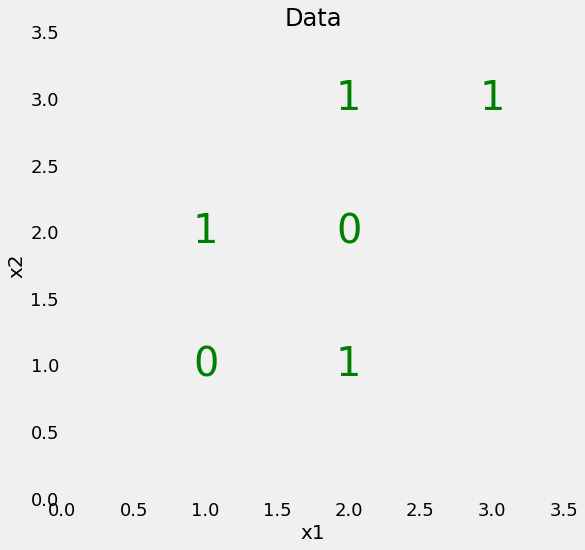

In [59]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Plot formatting
plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 18
plt.figure(figsize = (8, 8))

# Plot each point as the label
for x1, x2, label in zip(X[:, 0], X[:, 1], y):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'g',
             ha='center', va='center')
    
# Plot formatting
plt.grid(None);
plt.xlim((0, 3.5));
plt.ylim((0, 3.5));
plt.xlabel('x1', size = 20); plt.ylabel('x2', size = 20); plt.title('Data', size = 24)

This is a linearly inseparable problem. A simple linear classifier will not be able to draw a boundary! The single decision tree should be able to separate the points though because it essentially draws many repeated linear boundaries between points.

## Single Decision Tree

In Scikit-Learn, we can very quickly build and train a single decision tree on this data. The tree will learn how to separate the points, building a flowchart of questions based on the feature values and the labels. At each stage, the decision tree makes splits by maximizing the reduction in gini impurity. We'll use the default hyperparameters for the decision tree which means it can grow as deep as necessary. This will lead to overfittingm and in practice, we usually want to limit the depth of the tree so it can generalize to testing data.

In [60]:
from sklearn.tree import DecisionTreeClassifier

# Make a decision tree and train
tree = DecisionTreeClassifier(random_state=RSEED)
tree.fit(X, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=50,
            splitter='best')

In [61]:
print(f'Decision tree has {tree.tree_.node_count} nodes with maximum depth {tree.tree_.max_depth}.')

Decision tree has 9 nodes with maximum depth 3.


Our decision tree formed 9 nodes and reached a maximum depth of 3. It will have achieved 100% accuracy on the training data because we did not limit the depth and it therefore can classify every _training_ point perfectly.

In [62]:
print(f'Model Accuracy: {tree.score(X, y)}')

Model Accuracy: 1.0


## Visualize Decision Tree

To get a sense of how the decision tree "thinks", it's helpful to visualize the entire structure. This will show each node in the tree which we can use to make new predictions. Because the tree is relatively small, we can understand the entire image.

First we export the tree as a `dot` file making sure to label the features and the classes.

In [63]:
from sklearn.tree import export_graphviz

# Export as dot
export_graphviz(tree, 'tree.dot', rounded = True, 
                feature_names = ['x1', 'x2'], 
                class_names = ['0', '1'], filled = True)

Next we use a system command and the `dot` function to convert to a `png` (image). This requires graphviz to be installed. 

In [64]:
from subprocess import call
# Convert to png
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=400']);

Finally, we display the entire tree.

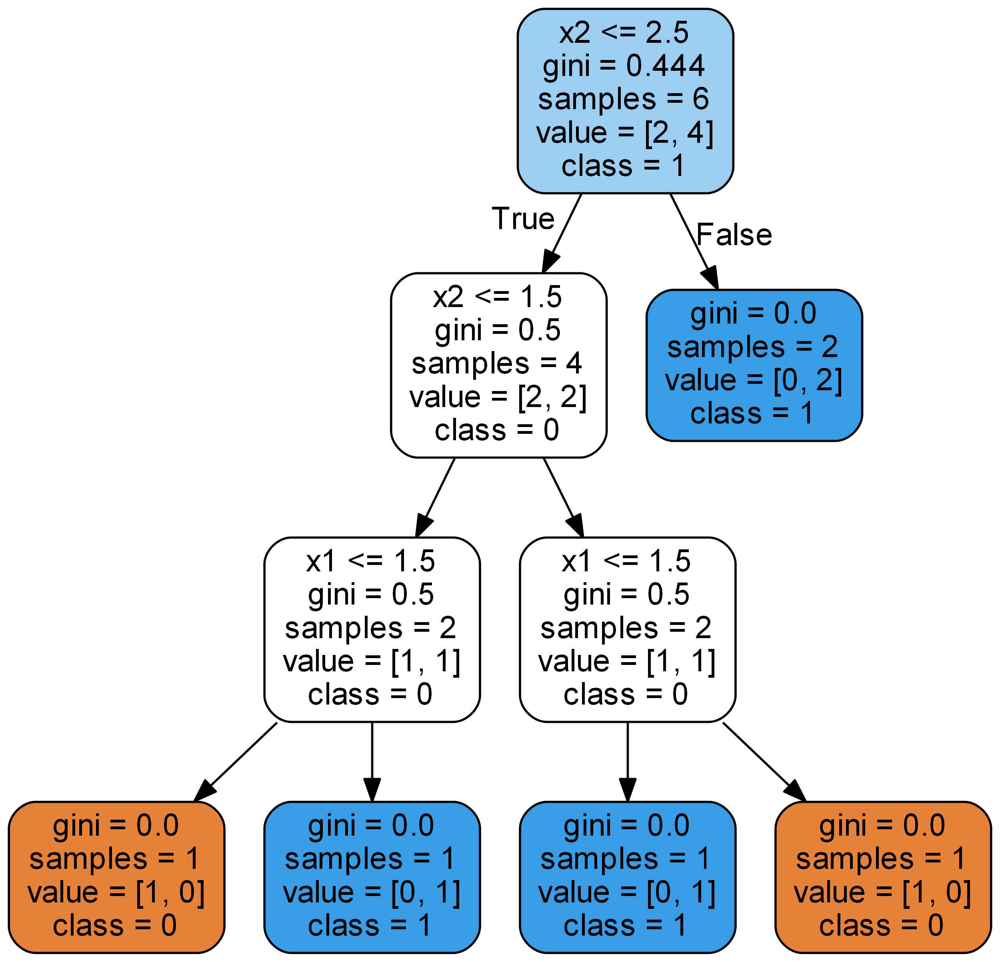

In [65]:
from IPython.display import Image
Image('tree.png')

A decision tree is an intuitive model: it makes decisions much as we might when faced with a problem by constructing a flowchart of questions and answers. For each of the nodes (except the leaf nodes), the five rows represent:

1. Question asked about the data based on a feature: this determines the way we traverse down the tree for a new datapoint.
2. `gini`: the Gini Impurity of the node. The average (weighted by samples) gini impurity decreases with each level of the tree.
3. `samples`: number of training observations in the node
4. `value`: [number of samples in first class, number of samples in second class]
5. `class`: the class predicted for all the points in the node if the tree ended at this depth

The leaf nodes (the terminal nodes at each branch) do not have a question because they are where the tree makes a prediction. All of the samples in a leaf node are assigned the same class. 

If we do them math, the average (weighted by number of samples) Gini Impurity decreases as we move down the tree. Eventually, the average Gini Impurity goes to 0.0 as we correctly classify each point. However, correctly classifiying every single training point is usually not a good indicator because that means the model will not be able to generalize to the testing data! This model correclty classifies every single point because we did not limit the maximum depth. 

In [66]:
# Limit maximum depth and train
short_tree = DecisionTreeClassifier(max_depth = 2, random_state=RSEED)
short_tree.fit(X, y)

print(f'Model Accuracy: {short_tree.score(X, y)}')

Model Accuracy: 0.6666666666666666


Our model no longer gets perfect accuracy on the _training data_. However, it probably would do better on the _testing data_ since we have limited the maximum depth to prevent overfitting. This is an example of the bias - variance tradeoff in machine learning.

# Make Predictions on new points

Next we define more points and see where the single tree places them. In fact, we can make the classifications ourselves using the above tree. Start at the top and work your way down for each point. Try to see if you come up with the correct answers! 

In [67]:
X_new = np.array([[0.5, 1.5],
                   [3, 2.6],
                   [1.5, 1.5],
                   [3, 0.9]])

If we use the decision tree, we arrive at 0 (bottom far left node), 1 (top right node), 0 (bottom far left node), and 1 (bottom second from left node). Let's test out this reasoning.

In [68]:
y_new_guess = np.array([0, 1, 0, 1])

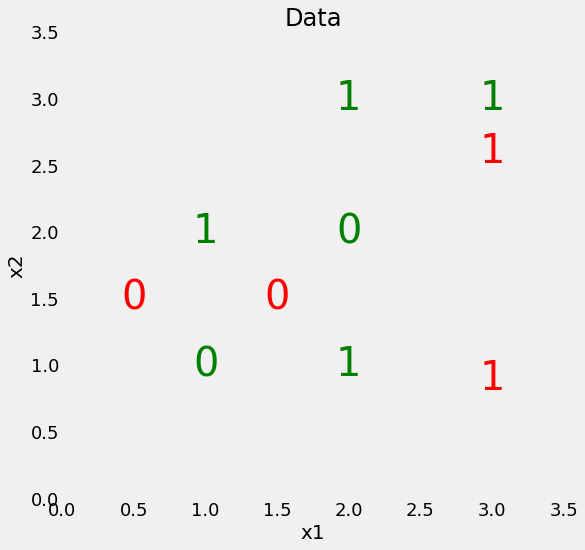

In [69]:
plt.figure(figsize = (8, 8))

# Original data
for x1, x2, label in zip(X[:, 0], X[:, 1], y):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'g',
                 ha='center', va='center')
# New points
for x1, x2, label in zip(X_new[:, 0], X_new[:, 1], y_new_guess):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'r',
                 ha='center', va='center')
    
plt.grid(None);
plt.xlim((0, 3.5));
plt.ylim((0, 3.5));
plt.xlabel('x1', size = 20); plt.ylabel('x2', size = 20); plt.title('Data', size = 24);

In [70]:
tree.predict(X_new)

array([0, 1, 0, 1])

It looks like we correctly parsed the tree for each of the new points. We can also print out the decision path for each prediction, which shows the nine nodes in the tree, and whether or not the given observation passed through the node (by 0 or 1).

In [71]:
path1 = tree.decision_path(X_new[0, :].reshape(1, -1))
path2 = tree.decision_path(X_new[1, :].reshape(1, -1))

In [72]:
path1.toarray()

array([[1, 1, 1, 1, 0, 0, 0, 0, 0]], dtype=int64)

This path shows the tree went left, left, left, left ending at the `class` = 0.

In [73]:
path2.toarray()

array([[1, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=int64)

This path shows the tree went right and then stayed there ending at the `class` = 1.

Hopefully this simple example has given you an idea of how a Decision Tree makes classifications. It looks at the features and the labels, and tries to construct a flowchart of questions that end in the correct classification for each label. If we don't limit the depth of the tree, it can correctly classify every single point in the training data. This will lead to overfitting though and an inability to do well on testing data. We didn't have any testing data in this example, but in the next problem, using a real-world dataset, we do and we'll see how overfitting can be an issue! 

# Move on to Real Dataset

The following data set is from the Costa Rica Household Poverty prediction challenge, a machine learning competition on Kaggle where the objective is to predict the poverty of a household. This data has already been formatted and cleaned.

This is a supervised binary classification task where the objective is to predict whether a house is in severe or moderate poverty (given by 0) or not in any poverty, given by 1. The problem is imbalanced (far more of one label than another) so for assessing performance, we'll use the F1 score rather than the accuracy.

In [159]:
df = pd.read_csv('data/2015_health.csv')
df.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENUM,...,_PAREC1,_PASTAE1,_LMTACT1,_LMTWRK1,_LMTSCL1,_RFSEAT2,_RFSEAT3,_FLSHOT6,_PNEUMO2,_AIDTST3
0,1.0,1.0,b'01292015',b'01',b'29',b'2015',1200.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0
1,1.0,1.0,b'01202015',b'01',b'20',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,2.0,2.0,3.0,3.0,4.0,2.0,2.0,NaN,NaN,2.0
2,1.0,1.0,b'02012015',b'02',b'01',b'2015',1200.0,2.015000e+09,2.015000e+09,1.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN
3,1.0,1.0,b'01142015',b'01',b'14',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,9.0
4,1.0,1.0,b'01142015',b'01',b'14',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0


In [160]:
df.dtypes.value_counts()

float64    323
object       7
dtype: int64

In [161]:
df = df.select_dtypes('number')

In [162]:
df['_RFHLTH'].value_counts()

1.0    358072
2.0     82137
9.0      1247
Name: _RFHLTH, dtype: int64

In [163]:
df = df.loc[df['_RFHLTH'].isin([1, 2])].copy()
df = df.rename(columns = {'_RFHLTH': 'label'})
df.shape

(440209, 323)

The label imbalanced means that accuracy is not the best metric. Instead we'll use the F1 score, the harmonic mean of precision and recall. We can also compute accuracy, just to show why it might not be the best measure.

We see that higher average education is correlated with no poverty, and a greater level of overcrowding is correlated with being in poverty. Feel free to explore the rest of the dataset! 

## Split Data into Training and Testing Set

To assess our predictions, we'll need to use a training and a testing set. The model learns from the training data and then makes predictions on the testing data. Since we have the correct answers for the testing data, we can tell how well the model is able to generalize to new data. It's important to only use the testing set once, because this is meant to be an estimate of how well the model will perform on new data. 

We'll save 30% of the examples for testing. 

In [164]:
from sklearn.model_selection import train_test_split

labels = np.array(df.pop('label'))
df = df.drop(columns = ['GENHLTH', 'PAINACT2', 'QLMENTL2', 'QLSTRES2', 'QLHLTH2'])


# 30% examples in test data
train, test, train_labels, test_labels = train_test_split(df, labels, 
                                                          stratify = labels,
                                                          test_size = 0.3, 
                                                          random_state = RSEED)

In [165]:
train = train.fillna(train.mean())
test = test.fillna(test.mean())

In [166]:
test.shape

(132063, 317)

In [101]:
from sklearn.preprocessing import Imputer

imputer = Imputer(strategy = 'median')
train = imputer.fit_transform(train)
test = imputer.transform(test)

In [167]:
train.shape

(308146, 317)

First, we'll train the decision tree on the data. Let's leave the depth unlimited and see if we get overfitting! 

In [168]:
# Train tree
tree.fit(train, train_labels)
print(f'Decision tree has {tree.tree_.node_count} nodes with maximum depth {tree.tree_.max_depth}.')

Decision tree has 49825 nodes with maximum depth 66.


In [169]:
from sklearn.metrics import f1_score

print(f'Train F1 Score: {f1_score(train_labels, tree.predict(train))}')
print(f'Test F1  Score: {f1_score(test_labels, tree.predict(test))}')

Train F1 Score: 1.0
Test F1  Score: 0.877831864477338


In [177]:
f1_score(test_labels, [1 for _ in range(len(test_labels))])

0.8971083783953067

In [180]:
from sklearn.metrics import precision_score, recall_score, roc_auc_score

precision_score(test_labels, [1 for _ in range(len(test_labels))])

0.8134148095984493

In [181]:
recall_score(test_labels, [1 for _ in range(len(test_labels))])

1.0

In [185]:
test_labels = [1 if x == 2 else 0 for x in test_labels]

In [187]:
roc_auc_score(test_labels, [0 for _ in range(len(test_labels))])

0.5

In [189]:
roc_auc_score(test_labels, tree.predict_proba(test)[:, 1])

0.7048984006864425

In [170]:
features = list(df.columns)

In [171]:
len(features)

317

In [172]:
train.shape

(308146, 317)

In [173]:
len(tree.feature_importances_)

317

In [174]:
fi = pd.DataFrame({'feature': features,
                   'importance': tree.feature_importances_}).sort_values('importance', 
                                                                         ascending = False)

In [175]:
fi.head()

,feature,importance
66,DIFFWALK,0.191586
22,PHYSHLTH,0.146201
249,_BMI5,0.014744
225,_LLCPWT,0.013189
45,DIABETE3,0.012306


Sure enough, the model has significantly overfit on the training data! 

In [52]:
f1_score(test_labels, [1 for _ in range(len(test_labels))])

0.8738738738738739

In [53]:
print(f'Train Accuracy: {tree.score(train, train_labels)}')
print(f'Valid Accuracy: {tree.score(valid, valid_labels)}')

Train Accuracy: 1.0


NameError: name 'valid' is not defined

Clearly our tree has overfit to the training data! 

### Visualize Full Tree

As before, we can look at the full decision tree on the data.

In [54]:
# Save tree as dot file
export_graphviz(tree, 'tree_real_data.dot', rounded = True, 
                feature_names = train.columns, 
                class_names = ['poverty', 'no poverty'], filled = True)

# Convert to png
call(['dot', '-Tpng', 'tree_real_data.dot', '-o', 'tree_real_data.png', '-Gdpi=400'])

# Visualize
Image(filename='tree_real_data.png')

# Random Forest 

Now we can move on to a more powerful model, the random forest. This takes the idea of a single decision tree, and creates a model out of many of them to reduce the bias between trees.

In [55]:
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100, random_state=RSEED, n_jobs=-1)

# Fit on training data
model.fit(train, train_labels)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=50, verbose=0, warm_start=False)

In [56]:
print(f'Train F1 Score: {f1_score(train_labels, model.predict(train))}')
print(f'Test F1  Score: {f1_score(test_labels, model.predict(test))}')

Train F1 Score: 1.0
Test F1  Score: 0.8864734299516908


In [46]:
x = pd.DataFrame({'importance': model.feature_importances_, 'feature': train.columns}).\
                  sort_values('importance', ascending = False)
x.head()

,importance,feature
25,0.049521,phones-per-capita
8,0.036494,meaneduc
46,0.029245,age-min
42,0.028426,escolari-max
22,0.028255,walls+roof+floor


In [47]:
y = pd.DataFrame({'importance': tree.feature_importances_, 'feature': train.columns}).\
                  sort_values('importance', ascending = False)
y.head()

,importance,feature
25,0.107771,phones-per-capita
51,0.059217,inst-max
8,0.052526,meaneduc
22,0.052013,walls+roof+floor
49,0.040915,age-std


The random forest has also overfit to the training data, but can better generalize to the testing data. 

In order to make sure our models are doing better than chance, we need to compare to a baseline estimate: guessing the most common label in the training data for all testing observations.

In [ ]:
print(f'Baseline Valid Accuracy: {np.mean(valid_labels == 1)}')

In [ ]:
from sklearn.metrics import roc_auc_score

In [ ]:
roc_auc_score(valid_labels, tree.predict_proba(valid)[:, 1])

In [ ]:
roc_auc_score(valid_labels, model.predict_proba(valid)[:, 1])

# Random Forest Optimization through Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Hyperparameter grid
param_grid = {
    'n_estimators': np.linspace(10, 1000).astype(int),
    'max_depth': [None] + list(np.linspace(3, 20).astype(int)),
    'max_features': ['auto', 'sqrt', None] + list(np.arange(0.5, 1, 0.02)),
    'max_leaf_nodes': [None] + list(np.linspace(10, 50, 500).astype(int)),
    'min_samples_split': [2, 5, 10],
    'bootstrap': [True, False]
}

# Estimator for use in random search
estimator = RandomForestClassifier(n_jobs=-1, random_state = RSEED)

# Create the random search model
rs = RandomizedSearchCV(estimator, param_grid, n_jobs = -1, 
                        scoring = 'roc_auc', cv = 3, 
                        n_iter = 50, verbose = 1, random_state=RSEED)

# Fit 
rs.fit(train, train_labels)

In [ ]:
rs.best_params_

In [ ]:
best_model = rs.best_estimator_

In [ ]:
print(f'Train Accuracy: {best_model.score(train, train_labels)}')
print(f'Validation Accuracy: {best_model.score(valid, valid_labels)}')

In [ ]:
roc_auc_score(valid_labels, best_model.predict_proba(valid)[:, 1])

In [ ]:
estimator = best_model.estimators_[1]

# Export a tree from the forest
export_graphviz(estimator, 'tree_from_forest.dot', rounded = True, 
                feature_names=train.columns,
                class_names = ['poverty', 'no poverty'], filled = True)

In [ ]:
call(['dot', '-Tpng', 'tree_from_forest.dot', '-o', 'tree_from_forest.png', '-Gdpi=400'])
Image('tree_from_forest.png')

# Conclusions

In this notebook, we saw both a single decision tree and a random forest. We demonstrated how a single decision tree severely overfits to the training data because it can get arbitrarily deep, but an entire random forest has much reduced variance. 